# Doublechecking net values

Some people have been [reporting problems](https://github.com/datasciencebr/serenata-de-amor/issues/85) in the value of `net_value` column in the CEAP datasets. It doesn't seem to really match what it should contain.

In [1]:
import pandas as pd
import numpy as np

filenames = ['../data/2016-08-08-current-year.xz',
             '../data/2016-08-08-last-year.xz',
             '../data/2016-08-08-previous-years.xz']
dataset = pd.DataFrame()

for filename in filenames:
    data = pd.read_csv(filename,
                       parse_dates=[16],
                       dtype={'document_id': np.str,
                              'congressperson_id': np.str,
                              'congressperson_document': np.str,
                              'term_id': np.str,
                              'cnpj_cpf': np.str,
                              'reimbursement_number': np.str})
    dataset = pd.concat([dataset, data])

In [2]:
len(dataset)

2072729

In [3]:
dataset['issue_date'] = pd.to_datetime(dataset['issue_date'], errors='coerce')

In [4]:
(dataset['document_value'].isnull()).sum()

17

In [5]:
dataset[dataset['document_value'].isnull()]

,document_id,congressperson_name,congressperson_id,congressperson_document,term,state,party,term_id,subquota_number,subquota_description,...,net_value,month,year,installment,passenger,leg_of_the_trip,batch_number,reimbursement_number,reimbursement_value,applicant_id
72863,5021378,ALMEIDA LIMA,160626,173,2011.0,SE,PMDB,54,5,Publicity of parliamentary activity,...,10000.00,10,2012,0,NaN,NaN,1005279,4159,NaN,2370
72864,5021389,ALMEIDA LIMA,160626,173,2011.0,SE,PMDB,54,5,Publicity of parliamentary activity,...,11300.00,10,2012,0,NaN,NaN,1005279,4159,NaN,2370
243933,5028079,CARLOS ZARATTINI,141398,398,2015.0,SP,PT,55,10,Telecommunication,...,29.90,2,2013,0,NaN,NaN,1007122,4189,NaN,1963
286036,5028084,DANIEL ALMEIDA,74060,188,2015.0,BA,PCdoB,55,3,Fuels and lubricants,...,3113.38,1,2013,0,NaN,NaN,1006976,4171,NaN,1562
422966,5062354,ELCIONE BARBALHO,74075,21,2015.0,PA,PMDB,55,13,Congressperson meal,...,26.87,3,2013,0,NaN,NaN,1016826,4238,NaN,1011
513864,5073020,FRANCISCO ESCÓRCIO,137983,567,2011.0,MA,PMDB,54,3,Fuels and lubricants,...,150.00,3,2013,0,NaN,NaN,1020110,4250,NaN,1762
652869,5063133,JANETE ROCHA PIETÁ,141455,358,2011.0,SP,PT,54,15,Aircraft renting or charter of aircraft,...,15.00,3,2013,0,NaN,NaN,1018289,4248,NaN,1852
670406,5020275,JESUS RODRIGUES,160671,115,2011.0,PI,PT,54,4,"Consultancy, research and technical work",...,7000.00,2,2013,0,NaN,NaN,1004983,4185,NaN,2380
1031812,5069601,MISSIONÁRIO JOSÉ OLIMPIO,160561,375,2015.0,SP,DEM,55,3,Fuels and lubricants,...,130.01,2,2013,0,NaN,NaN,1018899,4247,NaN,2388
1095064,5009532,ONYX LORENZONI,74399,510,2015.0,RS,DEM,55,3,Fuels and lubricants,...,2755.87,1,2013,0,NaN,NaN,1002170,4139,NaN,1627


In [6]:
dataset[dataset['document_value'].isnull()].iloc[0]

document_id                                               5021378
congressperson_name                                  ALMEIDA LIMA
congressperson_id                                          160626
congressperson_document                                       173
term                                                         2011
state                                                          SE
party                                                        PMDB
term_id                                                        54
subquota_number                                                 5
subquota_description          Publicity of parliamentary activity
subquota_group_id                                               0
subquota_group_description                                    NaN
supplier                                        JULIANO AMADEU ME
cnpj_cpf                                           11901432000190
document_number                                          00000007
document_t

In [7]:
is_reimbursed_but_has_no_value = dataset['reimbursement_number'].notnull() & \
    dataset['document_value'].isnull()
docs = dataset.loc[is_reimbursed_but_has_no_value, ['document_id', 'document_value', 'remark_value', 'net_value']]
docs

,document_id,document_value,remark_value,net_value
72863,5021378,NaN,5000.0,10000.00
72864,5021389,NaN,5700.0,11300.00
243933,5028079,NaN,0.0,29.90
286036,5028084,NaN,0.0,3113.38
422966,5062354,NaN,0.0,26.87
513864,5073020,NaN,0.0,150.00
652869,5063133,NaN,0.0,15.00
670406,5020275,NaN,0.0,7000.00
1031812,5069601,NaN,0.0,130.01
1095064,5009532,NaN,0.0,2755.87


None of the these documents have digitalized receipts.

In [8]:
def jarbas_url(document_id):
    return 'http://jarbas.datasciencebr.com/#/document_id/{}'.format(document_id)

docs['document_id'].apply(jarbas_url).tolist()

['http://jarbas.datasciencebr.com/#/document_id/5021378',
 'http://jarbas.datasciencebr.com/#/document_id/5021389',
 'http://jarbas.datasciencebr.com/#/document_id/5028079',
 'http://jarbas.datasciencebr.com/#/document_id/5028084',
 'http://jarbas.datasciencebr.com/#/document_id/5062354',
 'http://jarbas.datasciencebr.com/#/document_id/5073020',
 'http://jarbas.datasciencebr.com/#/document_id/5063133',
 'http://jarbas.datasciencebr.com/#/document_id/5020275',
 'http://jarbas.datasciencebr.com/#/document_id/5069601',
 'http://jarbas.datasciencebr.com/#/document_id/5009532',
 'http://jarbas.datasciencebr.com/#/document_id/5030571',
 'http://jarbas.datasciencebr.com/#/document_id/5016649',
 'http://jarbas.datasciencebr.com/#/document_id/5020247',
 'http://jarbas.datasciencebr.com/#/document_id/5020251',
 'http://jarbas.datasciencebr.com/#/document_id/5020523',
 'http://jarbas.datasciencebr.com/#/document_id/5020531',
 'http://jarbas.datasciencebr.com/#/document_id/5020430']

Since we expect precision in our `net_value` calculation, I'm going to use integers and not floats.

In [9]:
import math

dataset = dataset.dropna(subset=['document_value'])
dataset['document_value_int'] = (dataset['document_value'] * 100.).apply(math.ceil).astype(np.int)
dataset['remark_value_int'] = (dataset['remark_value'] * 100.).apply(math.ceil).astype(np.int)
dataset['net_value_int'] = (dataset['net_value'] * 100.).apply(math.ceil).astype(np.int)
dataset['calc_net_value_int'] = dataset['document_value_int'] - dataset['remark_value_int']

In [10]:
((dataset['calc_net_value_int'] - dataset['net_value_int']) != 0).sum()

21434

In [11]:
dataset.iloc[0]

document_id                                                             5928744
congressperson_name                                           ABEL MESQUITA JR.
congressperson_id                                                        178957
congressperson_document                                                       1
term                                                                       2015
state                                                                        RR
party                                                                       DEM
term_id                                                                      55
subquota_number                                                               1
subquota_description          Maintenance of office supporting parliamentary...
subquota_group_id                                                             0
subquota_group_description                                                  NaN
supplier                                

In [12]:
dataset['diff_net_value'] = dataset['net_value_int'] - dataset['calc_net_value_int']
dataset.loc[dataset['diff_net_value'] != 0, 'diff_net_value'].describe()

count    2.143400e+04
mean    -6.495887e+04
std      3.402186e+05
min     -9.712858e+06
25%     -1.086200e+04
50%      1.000000e+00
75%      1.000000e+00
max      1.763608e+06
Name: diff_net_value, dtype: float64

What's the number of records with distinct values of `net_value` and our own `net_value`, considering acceptable a maximum difference of 2 cents?

In [13]:
with_significant_difference = dataset.loc[dataset['diff_net_value'].abs() > 2]

In [14]:
with_significant_difference['subquota_description'].describe()

count                    9457
unique                     17
top       Flight ticket issue
freq                     4319
Name: subquota_description, dtype: object

It's not just a single subquota, but almost all of them. Probably means that there's something intrinsic in the dataset we still don't know. 

In [15]:
print(len(dataset['subquota_description'].unique()))
print(len(with_significant_difference['subquota_description'].unique()))

18
17


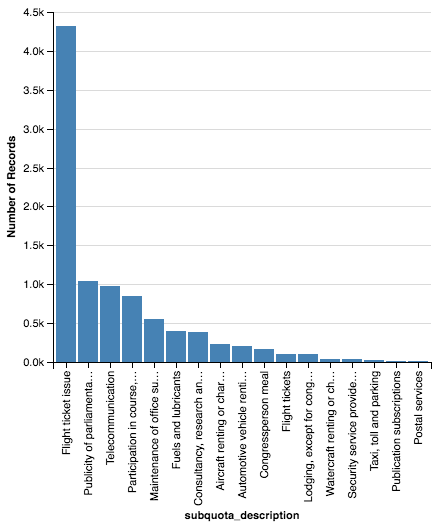

In [16]:
from altair import *

Chart(with_significant_difference).mark_bar().encode(
    x=X('subquota_description:O',
        sort=SortField(field='subquota_description',
                       order='descending',
                       op='count')),
    y='count(*):Q',
)

In [17]:
with_significant_difference['subquota_description'].unique()

array(['Security service provided by specialized company',
       'Fuels and lubricants', 'Publicity of parliamentary activity',
       'Automotive vehicle renting or charter',
       'Maintenance of office supporting parliamentary activity',
       'Telecommunication', 'Congressperson meal',
       'Taxi, toll and parking',
       'Consultancy, research and technical work',
       'Lodging, except for congressperson from Distrito Federal',
       'Flight tickets', 'Publication subscriptions',
       'Flight ticket issue', 'Aircraft renting or charter of aircraft',
       'Participation in course, talk or similar event', 'Postal services',
       'Watercraft renting or charter'], dtype=object)

I want to perform a further investigation in flight ticket issues, since [it's already documented](http://jarbas.datasciencebr.com/static/ceap-datasets.html) that `net_value`'s may be negative given canceled flights.

In [18]:
flight_ticket_issues = with_significant_difference['subquota_description'] == 'Flight ticket issue'
with_significant_difference.loc[flight_ticket_issues, 'net_value'].head(10)

37628     1870.16
49896      815.26
49922      839.32
62640     -480.58
62641      961.16
65229       58.00
77422      495.16
78867     1329.26
101579     260.00
116316     298.89
Name: net_value, dtype: float64

Here we have 3 documents with `reimbursement_number` equal to zero. How about disconsidering them to start? If there's no `reimbursement_number`, we could assume that no reimbursement happened (if the data says data, the Chamber of Deputies should be contacted to confirm the affirmation).

In [19]:
with_significant_difference.loc[flight_ticket_issues & \
                                (with_significant_difference['congressperson_id'] == '178983')]

,document_id,congressperson_name,congressperson_id,congressperson_document,term,state,party,term_id,subquota_number,subquota_description,...,leg_of_the_trip,batch_number,reimbursement_number,reimbursement_value,applicant_id,document_value_int,remark_value_int,net_value_int,calc_net_value_int,diff_net_value
116316,NaN,MARCIO ALVINO,178983,370,2015.0,SP,PR,55,999,Flight ticket issue,...,BSB/GRU,0,0,NaN,3061,9963,0,29889,9963,19926
116333,NaN,MARCIO ALVINO,178983,370,2015.0,SP,PR,55,999,Flight ticket issue,...,BSB/GRU,0,0,NaN,3061,9963,0,29889,9963,19926
116396,NaN,MARCIO ALVINO,178983,370,2015.0,SP,PR,55,999,Flight ticket issue,...,BSB/GRU,0,0,NaN,3061,17063,0,34126,17063,17063


In [20]:
dataset['reimbursement_number'] = \
    dataset['reimbursement_number'].replace('0', None)
dataset = dataset.dropna(subset=['reimbursement_number'])

In [21]:
dataset['document_id'].isnull().sum()

972391

In [22]:
with_significant_difference = dataset.loc[dataset['diff_net_value'].abs() > 2]
len(with_significant_difference)

9307

In [23]:
flight_ticket_issues = with_significant_difference['subquota_description'] == 'Flight ticket issue'
with_significant_difference.loc[flight_ticket_issues].head()

,document_id,congressperson_name,congressperson_id,congressperson_document,term,state,party,term_id,subquota_number,subquota_description,...,leg_of_the_trip,batch_number,reimbursement_number,reimbursement_value,applicant_id,document_value_int,remark_value_int,net_value_int,calc_net_value_int,diff_net_value
37628,NaN,CLARISSA GAROTINHO,178939,294,2015.0,RJ,PR,55,999,Flight ticket issue,...,SDU/BSB,0,5506,NaN,3036,93508,0,187016,93508,93508
49896,NaN,DULCE MIRANDA,178994,61,2015.0,TO,PMDB,55,999,Flight ticket issue,...,BSB/PMW,0,5440,NaN,2905,40763,0,81526,40763,40763
49922,NaN,DULCE MIRANDA,178994,61,2015.0,TO,PMDB,55,999,Flight ticket issue,...,PMW/BSB,0,5440,NaN,2905,41966,0,83932,41966,41966
62640,NaN,FÉLIX MENDONÇA JÚNIOR,160666,195,2015.0,BA,PDT,55,999,Flight ticket issue,...,SSA/BSB,0,5463,NaN,2307,-24029,0,-48058,-24029,-24029
62641,NaN,FÉLIX MENDONÇA JÚNIOR,160666,195,2015.0,BA,PDT,55,999,Flight ticket issue,...,SSA/BSB,0,5463,NaN,2307,48058,0,96116,48058,48058


In [24]:
with_significant_difference.loc[flight_ticket_issues].iloc[0]

document_id                                   NaN
congressperson_name            CLARISSA GAROTINHO
congressperson_id                          178939
congressperson_document                       294
term                                         2015
state                                          RJ
party                                          PR
term_id                                        55
subquota_number                               999
subquota_description          Flight ticket issue
subquota_group_id                               0
subquota_group_description                    NaN
supplier                          Cia Aérea - GOL
cnpj_cpf                           07575651000159
document_number                   Bilhete: CGB8TZ
document_type                                   0
issue_date                    2016-04-07 00:00:00
document_value                             935.08
remark_value                                    0
net_value                                 1870.16


In [25]:
dataset[(dataset['congressperson_name'] == 'CLARISSA GAROTINHO') & \
        (dataset['month'] == 4) & \
        (dataset['year'] == 2016) & \
        (dataset['subquota_description'] == 'Flight ticket issue')]['net_value_int'].sum()

794619

In [26]:
dataset.loc[dataset['document_number'] == 'Bilhete: VHVK6G']

,document_id,congressperson_name,congressperson_id,congressperson_document,term,state,party,term_id,subquota_number,subquota_description,...,leg_of_the_trip,batch_number,reimbursement_number,reimbursement_value,applicant_id,document_value_int,remark_value_int,net_value_int,calc_net_value_int,diff_net_value
37661,NaN,CLARISSA GAROTINHO,178939,294,2015.0,RJ,PR,55,999,Flight ticket issue,...,BSB/SDU,0,5506,NaN,3036,73813,0,73813,73813,0
37662,NaN,CLARISSA GAROTINHO,178939,294,2015.0,RJ,PR,55,999,Flight ticket issue,...,BSB/SDU,0,5506,NaN,3036,73813,0,73813,73813,0
37663,NaN,CLARISSA GAROTINHO,178939,294,2015.0,RJ,PR,55,999,Flight ticket issue,...,BSB/BSB,0,5506,NaN,3036,-51363,0,-51363,-51363,0


In [27]:
dataset.loc[dataset['document_number'] == 'Bilhete: VHVK6G'].iloc[0]

document_id                                   NaN
congressperson_name            CLARISSA GAROTINHO
congressperson_id                          178939
congressperson_document                       294
term                                         2015
state                                          RJ
party                                          PR
term_id                                        55
subquota_number                               999
subquota_description          Flight ticket issue
subquota_group_id                               0
subquota_group_description                    NaN
supplier                          Cia Aérea - GOL
cnpj_cpf                           07575651000159
document_number                   Bilhete: VHVK6G
document_type                                   0
issue_date                    2016-04-13 00:00:00
document_value                             738.13
remark_value                                    0
net_value                                  738.13


In [28]:
dataset.loc[dataset['document_number'] == 'Bilhete: VHVK6G'].iloc[1]

document_id                                   NaN
congressperson_name            CLARISSA GAROTINHO
congressperson_id                          178939
congressperson_document                       294
term                                         2015
state                                          RJ
party                                          PR
term_id                                        55
subquota_number                               999
subquota_description          Flight ticket issue
subquota_group_id                               0
subquota_group_description                    NaN
supplier                          Cia Aérea - GOL
cnpj_cpf                           07575651000159
document_number                   Bilhete: VHVK6G
document_type                                   0
issue_date                    2016-04-13 00:00:00
document_value                             738.13
remark_value                                    0
net_value                                  738.13


In [29]:
dataset.loc[dataset['document_number'] == 'Bilhete: VHVK6G'].iloc[2]

document_id                                   NaN
congressperson_name            CLARISSA GAROTINHO
congressperson_id                          178939
congressperson_document                       294
term                                         2015
state                                          RJ
party                                          PR
term_id                                        55
subquota_number                               999
subquota_description          Flight ticket issue
subquota_group_id                               0
subquota_group_description                    NaN
supplier                          Cia Aérea - GOL
cnpj_cpf                           07575651000159
document_number                   Bilhete: VHVK6G
document_type                                   0
issue_date                    2016-04-19 00:00:00
document_value                            -513.63
remark_value                                    0
net_value                                 -513.63


The dataset contains multiple records for the same `document_number`. In this case, they correspond to multiple flight tickets to the same flight, but for distinct passengers.

In [30]:
dataset.loc[dataset['document_number'] == 'Bilhete: VHVK6G',
            ['document_value_int', 'remark_value_int', 'document_number', 'reimbursement_number', 'passenger', 'net_value_int', 'calc_net_value_int']]

,document_value_int,remark_value_int,document_number,reimbursement_number,passenger,net_value_int,calc_net_value_int
37661,73813,0,Bilhete: VHVK6G,5506,CLARISSA GAROTINHO,73813,73813
37662,73813,0,Bilhete: VHVK6G,5506,SAMPAIO/ANACAROLINA,73813,73813
37663,-51363,0,Bilhete: VHVK6G,5506,CLARISSA GAROTINHO,-51363,-51363


http://jarbas.datasciencebr.com/#/document_id/5914504

These documents seem to correspond to the same receipt. The reimbursements were claimed in the same `batch_number` but in distinct reimbursements (`reimbursement_number`).

Together, `document_value`, `remark_value` and `net_value` make sense.

In [31]:
with_significant_difference[with_significant_difference['document_id'] == '5914504']

,document_id,congressperson_name,congressperson_id,congressperson_document,term,state,party,term_id,subquota_number,subquota_description,...,leg_of_the_trip,batch_number,reimbursement_number,reimbursement_value,applicant_id,document_value_int,remark_value_int,net_value_int,calc_net_value_int,diff_net_value
27,5914504,ABEL MESQUITA JR.,178957,1,2015.0,RR,DEM,55,8,Security service provided by specialized company,...,NaN,1264155,5381,NaN,3074,850000,0,20000,850000,-830000
28,5914504,ABEL MESQUITA JR.,178957,1,2015.0,RR,DEM,55,8,Security service provided by specialized company,...,NaN,1264155,5386,NaN,3074,850000,0,830000,850000,-20000


The Chamber of Deputies just use `applicant_id`, `year` and `document_id` when refering to a reimbursement. If all of them together count as a single reimbursement, an expense is an aggregation of all rows with the same above. attributes.

Let's prove the affirmation above analysing the whole dataset and checking if the values make more sense after.

In [32]:
data_with_id = dataset[(~dataset['document_id'].isnull()) &
                       (~dataset['year'].isnull()) &
                       (~dataset['applicant_id'].isnull())]

In [33]:
keys = ['applicant_id', 'year', 'document_id']
grouped = data_with_id.groupby(keys)
len(grouped)

1097629

In [34]:
reimbursement_numbers = grouped['reimbursement_number'].agg(lambda x: ','.join(set(x))).reset_index()
agg_net_values_int = grouped['net_value_int'].agg(np.sum).reset_index()

In [35]:
agg_net_values_int.head()

,applicant_id,year,document_id,net_value_int
0,12,2011,1988754,238754
1,12,2011,1988755,211247
2,12,2011,1988756,423550
3,12,2011,1996863,200000
4,12,2011,1996874,200000


In [36]:
agg_data = pd.merge(pd.merge(reimbursement_numbers, agg_net_values_int, on=keys),
                    data_with_id,
                    on=keys,
                    suffixes=('', '_from_original'))
agg_data.head()

,applicant_id,year,document_id,reimbursement_number,net_value_int,congressperson_name,congressperson_id,congressperson_document,term,state,...,passenger,leg_of_the_trip,batch_number,reimbursement_number_from_original,reimbursement_value,document_value_int,remark_value_int,net_value_int_from_original,calc_net_value_int,diff_net_value
0,12,2011,1988754,3513,238754,JOSÉ MENDONÇA BEZERRA,74425,149,2007.0,PE,...,NaN,NaN,513758,3513,NaN,238754,0,238754,238754,0
1,12,2011,1988755,3513,211247,JOSÉ MENDONÇA BEZERRA,74425,149,2007.0,PE,...,NaN,NaN,513758,3513,NaN,236640,25393,211247,211247,0
2,12,2011,1988756,3513,423550,JOSÉ MENDONÇA BEZERRA,74425,149,2007.0,PE,...,NaN,NaN,513759,3513,NaN,423550,0,423550,423550,0
3,12,2011,1996863,3535,200000,JOSÉ MENDONÇA BEZERRA,74425,149,2007.0,PE,...,NaN,NaN,516032,3535,NaN,200000,0,200000,200000,0
4,12,2011,1996874,3535,200000,JOSÉ MENDONÇA BEZERRA,74425,149,2007.0,PE,...,NaN,NaN,516032,3535,NaN,200000,0,200000,200000,0


There are 2,072,559 documents in the datasets, but when considering just the combination of non-empty values for `applicant_id`, `year` and `document_id`, half of that is found. In other words, the CEAP seem to have paid for about 1MM expenses so far.

In [37]:
len(agg_data)

1100168

In [38]:
agg_data.drop_duplicates(subset=keys, inplace=True)

len(agg_data)

1097629

In [39]:
agg_data.drop(['reimbursement_number_from_original',
               'net_value_int_from_original'],
              axis=1,
              inplace=True)

In [40]:
agg_data['document_value_int'] = (agg_data['document_value'] * 100.).apply(math.ceil).astype(np.int)
agg_data['remark_value_int'] = (agg_data['remark_value'] * 100.).apply(math.ceil).astype(np.int)
# agg_data['net_value_int'] = (agg_data['net_value'] * 100.).apply(math.ceil).astype(np.int)
agg_data['calc_net_value_int'] = agg_data['document_value_int'] - agg_data['remark_value_int']
agg_data['diff_net_value'] = agg_data['net_value_int'] - agg_data['calc_net_value_int']

In [41]:
with_significant_difference = agg_data.loc[agg_data['diff_net_value'].abs() > 2]

Disconsidering multiple records with this same combination, just 744 remain with a large difference between our own calculation of `net_value`s and the value directly in the original dataset.

In [42]:
len(with_significant_difference)

744

The majority of records were explained by the previous test, having all the flight ticket issues disappeared (though a few "Flight tickets" remain).

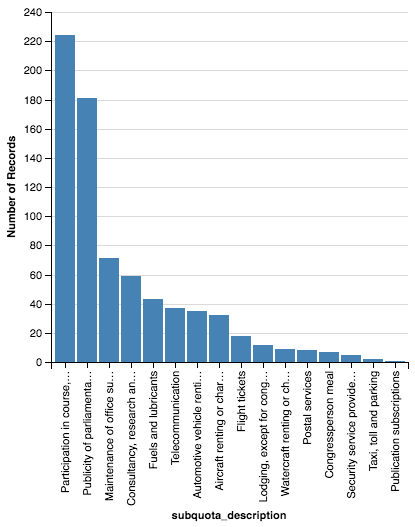

In [43]:
Chart(with_significant_difference).mark_bar().encode(
    x=X('subquota_description:O',
        sort=SortField(field='subquota_description',
                       order='descending',
                       op='count')),
    y='count(*):Q',
)

In [44]:
agg_data[agg_data['reimbursement_number'].str.contains(',')]

,applicant_id,year,document_id,reimbursement_number,net_value_int,congressperson_name,congressperson_id,congressperson_document,term,state,...,month,installment,passenger,leg_of_the_trip,batch_number,reimbursement_value,document_value_int,remark_value_int,calc_net_value_int,diff_net_value
326,19,2015,5745646,"5105,5106",520001,BENITO GAMA,74535,190,2015.0,BA,...,7,0,NaN,NaN,1212128,NaN,520000,0,520000,1
1058,59,2014,5357448,"4608,4600,4617,4945",400000,COSTA FERREIRA,74016,571,2011.0,MA,...,3,0,NaN,NaN,1096995,NaN,400000,0,400000,0
1594,80,2013,5121244,"4293,4296",1225000,PAES LANDIM,74319,118,2015.0,PI,...,5,0,NaN,TERESINA/SÃO LUIZ/PARNAIBA/SÃO JOÃO DO PI/SÃO ...,1032094,NaN,1225000,0,1225000,0
1609,80,2013,5160515,"4357,4344",1329997,PAES LANDIM,74319,118,2015.0,PI,...,6,0,NaN,TERES/BOM JESUS/SJPI/SRN/SJPI/PARNAIBA/CORRENT...,1042476,NaN,1330000,0,1330000,-3
1620,80,2013,5186721,"4375,4381",1578098,PAES LANDIM,74319,118,2015.0,PI,...,7,0,NaN,TERESINA/PARNAIBA/OEIRAS/BOM JESUS/SRN/FRONTEI...,1049416,NaN,1578100,0,1578100,-2
1635,80,2013,5248632,"4435,4431",770000,PAES LANDIM,74319,118,2015.0,PI,...,10,0,NaN,TERESINA/SÃO JOÃO DO PI/BOM JESUS/TERESINA,1065779,NaN,770000,0,770000,0
1647,80,2013,5279584,"4458,4455",1556004,PAES LANDIM,74319,118,2015.0,PI,...,11,0,NaN,NaN,1074447,NaN,1556000,0,1556000,4
1659,80,2013,5292649,"4475,4504",70907,PAES LANDIM,74319,118,2015.0,PI,...,12,1,NaN,NaN,1078190,NaN,78899,589,78310,-7403
1688,80,2014,5397666,"4648,4653",442785,PAES LANDIM,74319,118,2015.0,PI,...,4,0,NaN,NaN,1108899,NaN,442786,0,442786,-1
1866,80,2015,5817256,"5202,5191",40000,PAES LANDIM,74319,118,2015.0,PI,...,9,0,NaN,NaN,1233889,NaN,40000,0,40000,0


The document with major positive difference in the dataset doesn't seem to have any irregularity. The deputy asked the reimbursement for R\$ 25.000,00, but received just R\$ 6.376,11.

In [45]:
with_significant_difference.sort_values('diff_net_value').iloc[0]

applicant_id                                                 3031
year                                                         2015
document_id                                               5923763
reimbursement_number                                    5387,5366
net_value_int                                              637611
congressperson_name                                     ZÉ CARLOS
congressperson_id                                          178889
congressperson_document                                        86
term                                                         2015
state                                                          MA
party                                                          PT
term_id                                                        55
subquota_number                                                 5
subquota_description          Publicity of parliamentary activity
subquota_group_id                                               0
subquota_g

Deputies receiving less money than they asked is OK. What if they are receiving more than they should (values in the `document_value` column)?

In [46]:
has_extra_reimbursement = with_significant_difference['diff_net_value'] > 0
extra_reimbursement = with_significant_difference[has_extra_reimbursement]. \
    sort_values('diff_net_value', ascending=False)
len(extra_reimbursement)

95

In [47]:
extra_reimbursement.head()

,applicant_id,year,document_id,reimbursement_number,net_value_int,congressperson_name,congressperson_id,congressperson_document,term,state,...,month,installment,passenger,leg_of_the_trip,batch_number,reimbursement_value,document_value_int,remark_value_int,calc_net_value_int,diff_net_value
982176,2899,2016,5951638,"5399,5396",793763,ODORICO MONTEIRO,178868,107,2015.0,CE,...,2,0,NaN,NaN,1275947,NaN,490000,18896,471104,322659
372214,1793,2015,5767189,5152,329886,LUIZ CARLOS BUSATO,141485,488,2015.0,RS,...,7,0,NaN,NaN,1218862,NaN,345500,319502,25998,303888
207106,1411,2012,2450220,4140,226929,RICARDO BERZOINI,74793,390,2011.0,SP,...,12,1,NaN,NaN,654789,NaN,384896,451754,-66858,293787
748508,2331,2015,5756825,"5156,5132",566739,WASHINGTON REIS,160620,326,2015.0,RJ,...,7,0,NaN,NaN,1215673,NaN,315851,0,315851,250888
1010313,2949,2016,5983086,5436,650000,JUNIOR MARRECA,178885,78,2015.0,MA,...,4,1,NaN,NaN,1285906,NaN,650000,210000,440000,210000


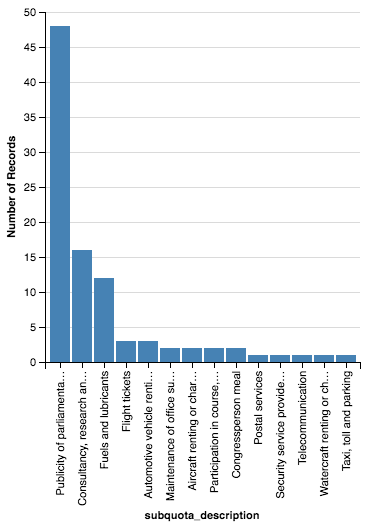

In [48]:
Chart(extra_reimbursement).mark_bar().encode(
    x=X('subquota_description:O',
        sort=SortField(field='subquota_description',
                       order='descending',
                       op='count')),
    y='count(*):Q',
)

In [49]:
extra_reimbursement.sort_values('diff_net_value', ascending=False).iloc[0]

applicant_id                                      2899
year                                              2016
document_id                                    5951638
reimbursement_number                         5399,5396
net_value_int                                   793763
congressperson_name                   ODORICO MONTEIRO
congressperson_id                               178868
congressperson_document                            107
term                                              2015
state                                               CE
party                                             PROS
term_id                                             55
subquota_number                                      3
subquota_description              Fuels and lubricants
subquota_group_id                                    1
subquota_group_description        Veículos Automotores
supplier                      MIGUEL PETROLEO COMERCIO
cnpj_cpf                                09027878000195
document_n

This document says that a deputy received R\$ 3.226,59 more than it should. Let's check all the datasets we have to see if there's any mistake in the calculation.

In [50]:
dataset[dataset['document_id'] == '5951638']

,document_id,congressperson_name,congressperson_id,congressperson_document,term,state,party,term_id,subquota_number,subquota_description,...,leg_of_the_trip,batch_number,reimbursement_number,reimbursement_value,applicant_id,document_value_int,remark_value_int,net_value_int,calc_net_value_int,diff_net_value
134863,5951638,ODORICO MONTEIRO,178868,107,2015.0,CE,PROS,55,3,Fuels and lubricants,...,NaN,1275947,5396,NaN,2899,490000,18896,435466,471104,-35638
134864,5951638,ODORICO MONTEIRO,178868,107,2015.0,CE,PROS,55,3,Fuels and lubricants,...,NaN,1275947,5399,NaN,2899,490000,18896,358297,471104,-112807


In [51]:
data_with_id[data_with_id['document_id'] == '5951638']

,document_id,congressperson_name,congressperson_id,congressperson_document,term,state,party,term_id,subquota_number,subquota_description,...,leg_of_the_trip,batch_number,reimbursement_number,reimbursement_value,applicant_id,document_value_int,remark_value_int,net_value_int,calc_net_value_int,diff_net_value
134863,5951638,ODORICO MONTEIRO,178868,107,2015.0,CE,PROS,55,3,Fuels and lubricants,...,NaN,1275947,5396,NaN,2899,490000,18896,435466,471104,-35638
134864,5951638,ODORICO MONTEIRO,178868,107,2015.0,CE,PROS,55,3,Fuels and lubricants,...,NaN,1275947,5399,NaN,2899,490000,18896,358297,471104,-112807


In [52]:
extra_reimbursement[extra_reimbursement['document_id'] == '5951638']

,applicant_id,year,document_id,reimbursement_number,net_value_int,congressperson_name,congressperson_id,congressperson_document,term,state,...,month,installment,passenger,leg_of_the_trip,batch_number,reimbursement_value,document_value_int,remark_value_int,calc_net_value_int,diff_net_value
982176,2899,2016,5951638,"5399,5396",793763,ODORICO MONTEIRO,178868,107,2015.0,CE,...,2,0,NaN,NaN,1275947,NaN,490000,18896,471104,322659


In [53]:
extra_reimbursement[extra_reimbursement['document_id'] == '5951638'].iloc[0]

applicant_id                                      2899
year                                              2016
document_id                                    5951638
reimbursement_number                         5399,5396
net_value_int                                   793763
congressperson_name                   ODORICO MONTEIRO
congressperson_id                               178868
congressperson_document                            107
term                                              2015
state                                               CE
party                                             PROS
term_id                                             55
subquota_number                                      3
subquota_description              Fuels and lubricants
subquota_group_id                                    1
subquota_group_description        Veículos Automotores
supplier                      MIGUEL PETROLEO COMERCIO
cnpj_cpf                                09027878000195
document_n

Doesn't seem to have. Calculations are doing what it's expected and are following our understanding of the dataset.

There's a possibility that this extra payment counted towards other requests for reimbursements. Let's check.

In [54]:
dataset[(dataset['applicant_id'] == 2899) & \
        (dataset['subquota_number'] == 3) & \
        (dataset['year'] == 2016) & \
        (dataset['month'].isin([1, 2, 3]))]

,document_id,congressperson_name,congressperson_id,congressperson_document,term,state,party,term_id,subquota_number,subquota_description,...,leg_of_the_trip,batch_number,reimbursement_number,reimbursement_value,applicant_id,document_value_int,remark_value_int,net_value_int,calc_net_value_int,diff_net_value
134842,5936100,ODORICO MONTEIRO,178868,107,2015.0,CE,PROS,55,3,Fuels and lubricants,...,NaN,1271344,5381,NaN,2899,2400,0,2400,2400,0
134844,5941750,ODORICO MONTEIRO,178868,107,2015.0,CE,PROS,55,3,Fuels and lubricants,...,NaN,1274395,5392,NaN,2899,5000,0,5000,5000,0
134845,5911608,ODORICO MONTEIRO,178868,107,2015.0,CE,PROS,55,3,Fuels and lubricants,...,NaN,1263204,5345,NaN,2899,10000,0,10000,10000,0
134847,5910002,ODORICO MONTEIRO,178868,107,2015.0,CE,PROS,55,3,Fuels and lubricants,...,NaN,1263203,5344,NaN,2899,5000,0,5000,5000,0
134848,5915078,ODORICO MONTEIRO,178868,107,2015.0,CE,PROS,55,3,Fuels and lubricants,...,NaN,1265871,5354,NaN,2899,26121,0,26121,26121,0
134849,5918158,ODORICO MONTEIRO,178868,107,2015.0,CE,PROS,55,3,Fuels and lubricants,...,NaN,1265871,5354,NaN,2899,24176,0,24176,24176,0
134850,5923660,ODORICO MONTEIRO,178868,107,2015.0,CE,PROS,55,3,Fuels and lubricants,...,NaN,1268782,5365,NaN,2899,24406,0,24406,24406,0
134851,5928513,ODORICO MONTEIRO,178868,107,2015.0,CE,PROS,55,3,Fuels and lubricants,...,NaN,1268783,5365,NaN,2899,23682,0,23682,23682,0
134852,5919933,ODORICO MONTEIRO,178868,107,2015.0,CE,PROS,55,3,Fuels and lubricants,...,NaN,1265871,5354,NaN,2899,4000,0,4000,4000,0
134853,5919956,ODORICO MONTEIRO,178868,107,2015.0,CE,PROS,55,3,Fuels and lubricants,...,NaN,1265871,5354,NaN,2899,5000,0,5000,5000,0


Can't see anything proving that. Going to analize the next reimbursement.

In [55]:
extra_reimbursement.sort_values('diff_net_value', ascending=False).iloc[1]

applicant_id                                  1793
year                                          2015
document_id                                5767189
reimbursement_number                          5152
net_value_int                               329886
congressperson_name             LUIZ CARLOS BUSATO
congressperson_id                           141485
congressperson_document                        488
term                                          2015
state                                           RS
party                                          PTB
term_id                                         55
subquota_number                                  3
subquota_description          Fuels and lubricants
subquota_group_id                                1
subquota_group_description    Veículos Automotores
supplier                             METROPOLITANO
cnpj_cpf                            88587589000117
document_number                               1047
document_type                  

In [56]:
(extra_reimbursement['remark_value'] > 0).sum()

55

Nope. Not a clue.

In [57]:
extra_reimbursement.sort_values('diff_net_value', ascending=False).iloc[2]

applicant_id                                                              1411
year                                                                      2012
document_id                                                            2450220
reimbursement_number                                                      4140
net_value_int                                                           226929
congressperson_name                                           RICARDO BERZOINI
congressperson_id                                                        74793
congressperson_document                                                    390
term                                                                      2011
state                                                                       SP
party                                                                       PT
term_id                                                                     54
subquota_number                                     

Not yet.

In [58]:
extra_reimbursement.sort_values('diff_net_value', ascending=False).iloc[3]

applicant_id                                             2331
year                                                     2015
document_id                                           5756825
reimbursement_number                                5156,5132
net_value_int                                          566739
congressperson_name                           WASHINGTON REIS
congressperson_id                                      160620
congressperson_document                                   326
term                                                     2015
state                                                      RJ
party                                                    PMDB
term_id                                                    55
subquota_number                                             3
subquota_description                     Fuels and lubricants
subquota_group_id                                           1
subquota_group_description               Veículos Automotores
supplier

## Conclusions

**There are documents (aka rows in the CEAP dataset) without a corresponding reimbursement number.** They don't even appear in the Chamber of Deputies website, but just in the XML provided by them. These records are identifiable by lack of a value for `reimbursement_number`. The reason why they were not reimbursement? Still not answered by the Chamber of Deputies.

**A request for reimbursement may be fulfilled in multiple reimbursements.** When this happens, multiple rows in the dataset, summing their `net_value`s will give `document_value - remark_value` as expected.

**There are 17 documents theorically reimbursed, but without `document_value` and a digitalized receipt.** Couldn't give further explanation without Chamber of Deputies' help.

**55 documents were theorically reimbursed in a value larger than they should.** Again, even a manual investigation couldn't explain their existence.